In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import h5py
from datetime import *
from math import floor
import torch

C:\Users\mbaro\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\mbaro\anaconda3\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
C:\Users\mbaro\anaconda3\lib\site-packages\numpy\.libs\libopenblas.XWYDX2IKJW2NMTWSFYNGFUWKQU3LYTCZ.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
def hot_encode(n_class , labels , L):

    ds = np.zeros((L,n_class) , dtype = int)

    for i in range(L):
        
        if labels[i] == 'walk to room':
            ds[i,0] = 1
        elif labels[i] == 'fall on floor of room':
            ds[i,1] = 1
        elif labels[i] == 'stand up from floor of room':
            ds[i,2] = 1
        elif labels[i] == 'walk to chair':
            ds[i,3] = 1
        elif labels[i] == 'sit down on chair':
            ds[i,4] = 1
        elif labels[i] == 'stand up from chair':
            ds[i,5] = 1
        elif labels[i] == 'walk to bed':
            ds[i,6] = 1
        elif labels[i] == 'sit down on bed':
            ds[i,7] = 1
        elif labels[i] == 'stand up from bed':
            ds[i,8] = 1
        elif labels[i] == 'get in  bed':
            ds[i,9] = 1
        elif labels[i] == 'lie in bed':
            ds[i,10] = 1
        elif labels[i] == 'roll in bed':
            ds[i,11] = 1
        elif labels[i] == 'sit in bed':
            ds[i,12] = 1
        elif labels[i] == 'get out  bed':
            ds[i,13] = 1
        
    return ds

print('Hotencoding ok!')

def get_seconds(time_str , printer = False):
    if printer == True:
        print('Time in hh:mm:ss:', time_str)
    # split in hh, mm, ss
    hh, mm, ss = time_str.split(':')
    hh , mm , ss = float(hh) , float(mm) , float(ss)
    Seconds = floor(float(ss))
    Decimals = ss - Seconds
    return int(hh) * 3600 + int(mm) * 60 + Seconds + Decimals

print('Datetime ok!')

Hotencoding ok!
Datetime ok!


In [112]:
n = 19
NNN = str(n)

N = 4

show = False

The final dataset will be two lists with 2$\times$N elements with the following order:

* set000 60GHz
* set000 77GHz
* set001 60GHz
* set001 77GHz
* ...
* set00(N-1) 60GHz
* set00(N-1) 77GHz

0
<HDF5 group "/radar/TI_xWR14xx" (3 members)>


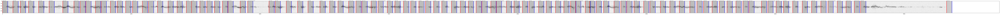

torch.Size([103, 98, 40])
torch.Size([103, 14])


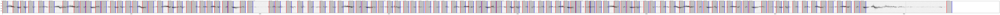

torch.Size([103, 98, 40])
torch.Size([103, 14])
1
<HDF5 group "/radar/TI_xWR14xx" (3 members)>


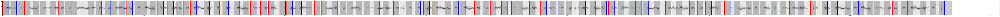

torch.Size([103, 98, 40])
torch.Size([103, 14])


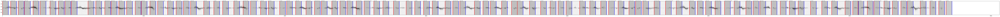

torch.Size([103, 98, 40])
torch.Size([103, 14])
2
<HDF5 group "/radar/TI_xWR14xx" (3 members)>


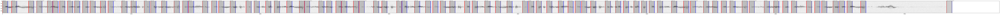

torch.Size([88, 98, 40])
torch.Size([88, 14])


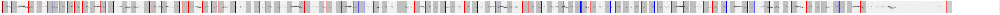

torch.Size([88, 98, 40])
torch.Size([88, 14])
3
<HDF5 group "/radar/TI_xWR14xx" (3 members)>


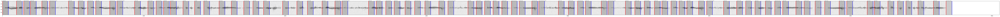

torch.Size([85, 98, 40])
torch.Size([85, 14])


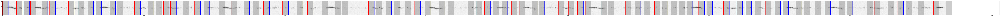

torch.Size([85, 98, 40])
torch.Size([85, 14])


In [114]:

list_images = []
list_labels = []

for I in range(N):
    
    print(I)
    
    m = str(I)
    
    if n < 10:

        path = 'subject_0' + NNN + '/subject_0'+ NNN + '/captured_data/set00' + m + '/'
        
    else:
        
        path = 'subject_' + NNN + '/subject_'+ NNN + '/captured_data/set00' + m + '/'
        
    ### UPLOAD OF THE LABEL DATASET, DELETE OF THE DATE PART OF TIME AND ONE HOT ENCODING OF THE LABELS

    lab = pd.read_csv(path + '/timestamp_speech.csv')
    
    TIME = lab['timestamp'].str.replace("2019-11-25T"," ")

    LAB = lab.command

    lab_ohe = hot_encode(14 , LAB , L = len(LAB))

    ### TRANSFORMATION OF THE TIME COMPONENT OF THE LABELS INTO SECONDS FOR IMAGES LABELING

    time = np.zeros(len(lab))

    time0 = get_seconds(TIME.iloc[0])

    for i in range(len(lab)):
        time[i] = get_seconds(TIME.iloc[i]) - time0

    K = 10.8108108108 # number of pixels per seconds
    K2 = 0.0925 # number of seconds per pixel

    lT = len(time)
    
    ### OPENING THE h5 file

    f = h5py.File(path + 'processed_data.h5' , 'r')
    F = f.get('radar')
    F1 , F2 = F.get('TI_xWR14xx') , F.get('TI_xWR68xx')
    print(F1)
    md1 , md2 = F1.get('mDoppler') , F2.get('mDoppler')

    #RDN1 , RDN2 = F1.get('rdn') , F2.get('rdn')
    #c1 , c2 = F1.get('cube') , F2.get('cube')
    
    for k in range(2):
        
        ### CHOOSING THE 60 OR 77 GHZ DATA
        
        if k == 0:
            md = md1 # 60 GHz
        else:
            md = md2 # 77 GHz
            
        Le = len(md[:,0])
        
        ### INITIALIZING THE DATASET

        dataset2 = np.zeros( ( Le , 98 ) )

        dataset3 = np.zeros( ( Le , 98 , 40 ) )
        
        ### POLISHING THE DATA

        for i in range(len(dataset2[:,0])):

            MD = md[i,:]

            microd = np.delete(MD , [63,64,65]) # remove center line

            microd = np.delete(microd , list(np.arange(0 , 14 , dtype = int))) # remove 'upper' bins

            microd = np.delete(microd , list(np.arange(len(microd)-13 , len(microd) , dtype = int))) # remove 'lower' bins
            
            dataset2[i] = microd
            
        tottime = max(time)-min(time)
        #print(max(time) , min(time) , tottime , Le/tottime)
        r = Le/tottime # px/s
        c = 0
        plt.figure(figsize = [200,200])
        plt.imshow(np.transpose(dataset2) , 'Greys')
        for i in range(len(time)):
            plt.axvspan(  (time[i])*r+c , (time[i]+3.7)*r+c  , color='k', alpha=0.2)
            plt.axvline(time[i]*r+c , color = 'red' ,linewidth = 3)
            plt.axvline(time[i]*r+3.7*r+c , color = 'blue' ,linewidth = 3)
            plt.text(time[i]*r+c , -1 , str(LAB.iloc[i]) , fontsize = 6)
        plt.show()

        DATASET = np.zeros((lT-1,98,40))
        LABELS = []
        LABELS_ENC = []       
        
        # each pixel corresponds to Le/lT seconds

        rango = np.arange(0,Le)
        for i in range(lT-1):
            I = np.argmin(np.abs(time[i]*r-rango))
            if I+40 < Le:
                DATASET[i,:,:] = np.transpose(dataset2[I:I+40,:])/np.max(dataset2[I:I+40,:])
            LABELS.append(np.array(LAB)[i])
            LABELS_ENC.append(lab_ohe[i])
            #print(I , time[i] , time[i]*r)
            #plt.imshow(np.transpose(dataset2[I:I+40,:]), 'Greys')
            #plt.show()           

        ### FINAL UPLOAD OF THE DATASET, EITHER IMAGES AND LABELS

        if show == True:
                       
            for i in range(lT-1):

                plt.figure(figsize = [5,5])
                plt.imshow(DATASET[i,:,:] , 'Greys_r')
                plt.title(LABELS[i])
                plt.xlabel(LABELS_ENC[i])
                plt.show()
                
        ### TENSORIALIZATION OF THE DATASET
        

        TENSOR_IMAGES = torch.tensor(DATASET , dtype = float)
        TENSOR_LABELS_OHE = torch.tensor(LABELS_ENC , dtype = int)
        
        print(TENSOR_IMAGES.shape)
        print(TENSOR_LABELS_OHE.shape)
        
        ### SAVING OF IN THE LIST
                       
        list_images.append(TENSOR_IMAGES)
        list_labels.append(TENSOR_LABELS_OHE)


In [115]:
print(len(list_images))

8


In [116]:
li = list_images
ll = list_labels
ds_images = torch.cat( ( li[0] , li[1] , li[2] , li[3] , li[4] , li[5] , li[6] , li[7] ) , 0 )
ds_labels = torch.cat( ( ll[0] , ll[1] , ll[2] , ll[3] , ll[4] , ll[5] , ll[6] , ll[7] ) , 0 )

print(ds_images.shape)
print(ds_labels.shape)



#for i in range(len(ds_images)):

#    plt.figure(figsize = [2,2])
#    plt.imshow(ds_images[i] , 'Greys_r')
#    plt.title(ds_labels[i] , fontsize = 5)
#    plt.axis('off')
#    plt.show()
    

    

torch.Size([758, 98, 40])
torch.Size([758, 14])


In [117]:
### SAVE THE TENSORS

folder = 'dataset_NN_new/'

if n < 10:
        
    torch.save(ds_images,folder + 'img' + 'subject_0' + NNN + '.t')
    torch.save(ds_labels,folder + 'lab' + 'subject_0' + NNN + '.t')
    
else:
        
    torch.save(ds_images,folder + 'img' + 'subject_' + NNN + '.t')
    torch.save(ds_labels,folder + 'lab' + 'subject_' + NNN + '.t')


In [118]:
f.close()